In [1]:
#아래 코드를 실행해 꼭 필요한 메시지 외 경고 메시지가 출력되지 않도록 해주세요.
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


# 내가 직접 만드는 강아지 고양이 분류기

:기계에게 강아지와 고양이 이미지를 학습시켜서 내 사진을 넣으면 어떤 판단을 하는지 확인해 볼 것이다

* 앞으로 이미지를 넣었을 때 강아지인지, 고양이인지 분류하는 모델을 만들 것

:텐서플로우(TensorFlow)를 활용해서 이미지를 분류할 수 있는 모델을 설계해 보겠습니다.

In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


## 1) 모델 학습을 위한 데이터셋(dataset) 준비하기

In [3]:
#패키지를 로드
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [4]:
#데이터를 가져오기
#"WARNING:absl:1738 images were corrupted and were skipped"라는 경고가 나타날 수 있습니다. 우선 무시하시면 됩니다.

(raw_train, raw_validation, raw_test), metadata = tfds.load('cats_vs_dogs',
                                                           split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
                                                           with_info = True, as_supervised = True,)

In [5]:
#각각의 데이터셋을 확인
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


모든 데이터셋은 (image, label)의 형태를 가집니다. ((None, None, 3), ())가 이를 나타내죠. 여기에서 앞에 있는 (None, None, 3)은 image의 shape를, 뒤의 ()는 정답 카테고리인 label의 shape를 의미합니다.

## 2)데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

raw_train 안에 있는 데이터를 확인해 보기 위해 tf.data.Dataset에서 제공하는 take라는 함수를 사용.

이 함수는 인수로 받은 개수만큼의 데이터를 추출하여 새로운 데이터셋 인스턴스를 생성하여 리턴하는 함수이다.

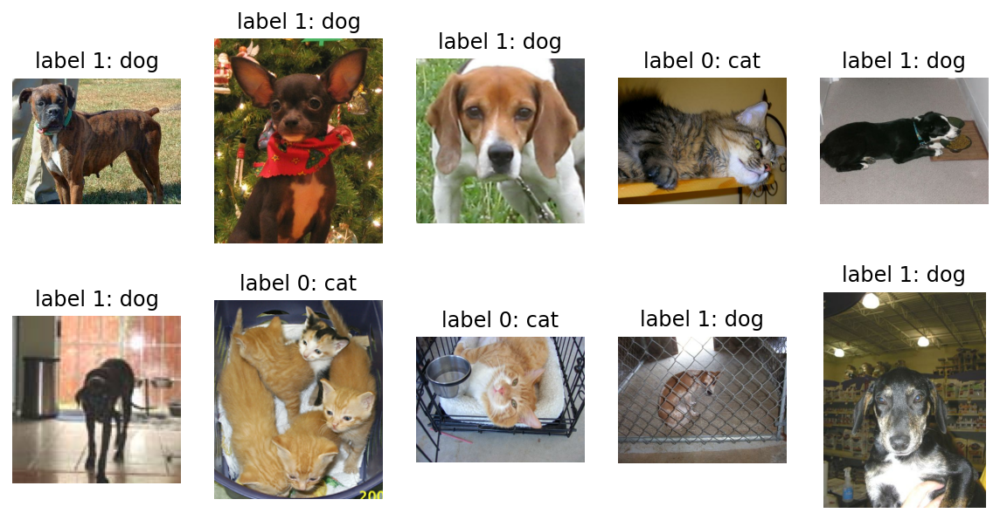

In [7]:
plt. figure(figsize = (10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):#10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

강아지는 label 1로, 고양이는 label 0으로 설정

모델을 학습시킬 때에는 이미지 사이즈를 통일시켜 주는 작업을 해야할 것 같다.

format_example() 함수를 이용해 이미지를 같은 포맷으로 통일 시켜 보자.

- 타입캐스팅(Type Casting): cast()

형변환이라고도 불리는 타입개스팅은 다른 데이터 타입으로 형(타입)을 바꿔주는 것을 의미한다. 정수형을 실수형으로 바꾸기 위해 float()를 사용하는 것이 타입캐스팅의 한 예이다.

In [8]:
IMG_SIZE = 160 #리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)# image=float(image)같은 타입캐스팅의  텐서플로우 버전이다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [9]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


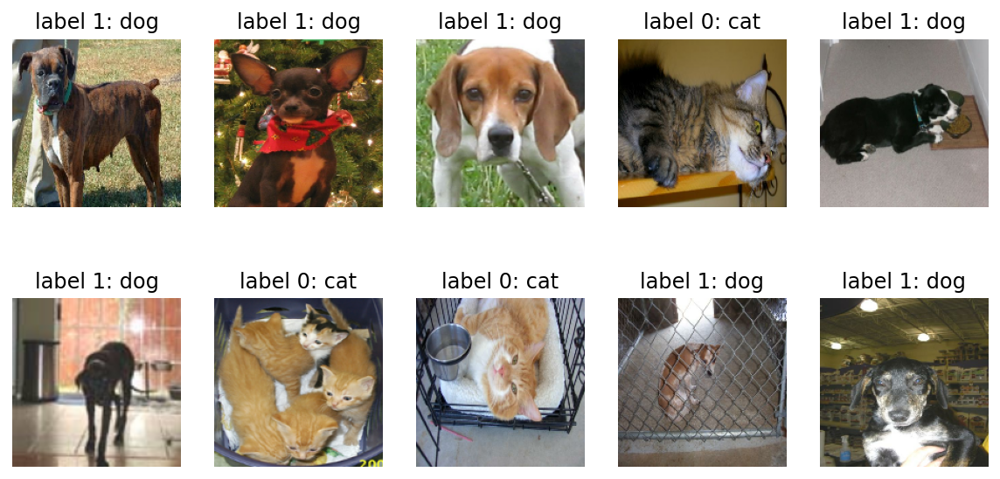

In [10]:
plt.figure(figsize = (10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image +1)/2 # 아래 마크다운에서 설명
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

위에서 image = (image/127.5) - 1 으로 픽셀값의 scale을 -1 ~ 1로 바꾸었는데 맷플롯립에서는 픽셀값이 양수여야 해서 1더하고 2로 나눠 픽셀 값을 0 ~ 1사이의 값으로 변환해주었다.

이미지 사이즈를 변환해 준 덕에 이미지의 크기가 다 같아진 것을 알 수 있다.

## 3)텐서플로우를 활용해 모델 구조 설계하기

:이 이미지들로 학습시킬 모델을 만들기

In [11]:
#모델 생성에 필요한 함수들을 가져오기
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D


models는 모델 그 자체를 구축하기 위한 함수들을 포함한다.

layers에는 모델의 구성 요소인 여러 가지 종류의 레이어(layer), 즉 "층"이라는 함수들을 가지고 있다.

Sequential은 말 그대로 "연속적인" 모델을 쌓기 위한 함수이다.

In [12]:
#모델 만들기
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units = 512, activation = 'relu'),
    Dense(units = 2, activation = 'softmax')
])

딥러닝 모델은 언제나 위와 같이 여러 개의 층을 쌓은 형태로 구성된다.

여기선 Conv2D, MaxPooling2D, Flatten, Dense라는 네 가지 종류의 레이어를 사용했다.

In [13]:
#모델의 전체 구조를 summary로 확인
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

summary() 메서드는 모델의 전체 구조를 한눈에 보여준다.

summary()에서 출력된 표는 (160, 160, 3) 크기의 이미지가 모델에 입력된 후 각 레이어를 지나면서 그 이미지의 사이즈가 어떻게 변화하는지를 나타내주고 있다.

None은 배치(batch) 사이즈에 따라 모델에 다른 수의 입력이 들어올 수 있음을 나타낸다.

flatten 계층을 만나 25,600(20x20x64)이라는 하나의 숫자로, 즉 1차원으로 shape가 줄어든다.

CNN(Convolutional Neural Net)에서 점점 작은 feature map이 출력되다가, Flatten과 Dense 레이어를 거쳐 1차원으로 shape이 줄어드는 네트워크는 CNN을 사용한 딥러닝 모델의 가장 대표적인 형태이다.

이미지 한 장이 입력되면 그 이미지는 Convolutional(합성곱) 연산을 통해 그 형태가 점점 길쭉해지다가, Flatten 레이어를 만나면 오른쪽처럼 한 줄로 펴진다. 3차원의 이미지를 1차원으로 펼치는 것이다.

In [14]:
#Flatten을 조금 더 직관적으로 이해하기 위해 배열을 다루기 용이한 numpy를 활용
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

#flatten 시키기
print('flatten 시킨 결과')
image.flatten()

(2, 2)
flatten 시킨 결과


array([1, 2, 3, 4])

모든 숫자를 일렬로 편 상태로 나타나게 된다. 모델에서 flatten 레이어를 통과한다는 것도 위와 같이 모든 숫자를 일렬로 펼쳐놓는 것과 같다.

그 후 Dense 레이어에서 512개의 노드로 축소시켜 최종 출력은 단 두 개의 숫자로 구성된 하나의 확률분포를 내뱉게 된다. 이 두 숫자는 각각 입력된 이미지가 강아지일 확률과 고양이인 확률을 의미하게 될 것이다.

정리해 보자면, 딥러닝 모델은 (160, 160, 3) 크기의 3차원 이미지를 입력받아 여러 레이어를 거치며 형태를 바꾸다가 최종적으로는 몇 개의 숫자를 출력해내는 함수라고 할 수 있다.

## 4)모델 compile 완료 후 학습시키기

:모델이 학습하는 데에 필요한 "학습률"(learning_rate)이라는 파라미터를 0.0001로 설정해주고, 모델을 compile 하여 학습할 수 있는 형태로 변환해주도록 하겠다.

In [15]:
learning_rate = 0.0001
model.compile(optimizer = tf.keras.optimizers.RMSprop(lr = learning_rate),
             loss = tf.keras.losses.sparse_categorical_crossentropy,
             metrics = ['accuracy'])

compile을 하기 위해서는 optimizer, loss, metrics 필요하다.

optimizer는 학습을 어떤 방식으로 시킬 것인지 결정한다. 어떻게 최적화시킬 것인지를 결정하기 때문에 최적화 함수라고 부르기도 한다.

loss는 모델이 학습해나가야 하는 방향을 결정한다. 이 문제에서는 모델의 출력은 입력받은 이미지가 고양이인지 강아지인지에 대한 확률분포로 두었으므로, 입력 이미지가 고양이(label=0)일 경우 모델의 출력이 [1.0, 0.0]에 가깝도록, 강아지(label=1)일 경우 [0.0, 1.0]에 가까워지도록 하는 방향을 제시한다.

metrics는 모델의 성능을 평가하는 척도이다. 분류 문제를 풀 때, 성능을 평가할 수 있는 지표는 정확도(accuracy), 정밀도(precision), 재현율(recall) 등이 있다. 여기서는 정확도를 사용했다.

In [16]:
#모델을 학습시킬 데이터를 준비
#한 스텝에 학습시킬 데이터의 개수인 BATCH_SIZE와 학습 데이터를 적절히 섞어줄 SHUFFLE_BUFFER_SIZE를 설정
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000


In [17]:
#train_batches는 모델이 끊임없이 학습될 수 있도록 전체 데이터에서 32개를 랜덤으로 뽑아 계속 제공해 줄 것
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)


In [18]:
#train_batches에서 하나의 batch만 꺼내 데이터를 확인
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape


(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [19]:
#초기 모델의 성능은 어떤지 확인
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

11/20 [===============>..............] - ETA: 0s - loss: 0.6898 - accuracy: 0.5341

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 3s 29ms/step - loss: 0.6913 - accuracy: 0.5297
initial loss: 0.69
initial accuracy: 0.53


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


validation(검증)을 하기 위한 데이터셋인 validation_batches를 이용해 20번의 예측을 해 보고, 평균 loss와 평균 accuracy를 확인해 보았다.

loss는 말 그대로 "손실"이라는 뜻으로, 얼마나 모델이 틀렸는지 나타낸다. 낮을수록 좋은 것이다.

accuracy는 몇 퍼센트의 정확도를 보이느냐에 대한 수치로, 높을 수록 좋은 것이다.

In [20]:
#10 epoch를 학습시켜서 정확도가 어떻게 변하는지 확인해 보자.
EPOCHS = 10
history = model.fit(train_batches,
                   epochs = EPOCHS,
                   validation_data = validation_batches)

Epoch 1/10
171/582 [=======>......................] - ETA: 16s - loss: 0.6624 - accuracy: 0.6107

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.6506 - accuracy: 0.6228

212/582 [=========>....................] - ETA: 14s - loss: 0.6495 - accuracy: 0.6229

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.6313 - accuracy: 0.6416

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.5969 - accuracy: 0.6744

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.5951 - accuracy: 0.6762

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.5927 - accuracy: 0.6784

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.5886 - accuracy: 0.6819

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.5879 - accuracy: 0.6827

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5840 - accuracy: 0.6858

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 43ms/step - loss: 0.5840 - accuracy: 0.6858 - val_loss: 0.5311 - val_accuracy: 0.7494
Epoch 2/10
169/582 [=======>......................] - ETA: 16s - loss: 0.4960 - accuracy: 0.7665

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.4980 - accuracy: 0.7642

213/582 [=========>....................] - ETA: 14s - loss: 0.4960 - accuracy: 0.7648

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.4905 - accuracy: 0.7659

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4773 - accuracy: 0.7718

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4778 - accuracy: 0.7712

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.4764 - accuracy: 0.7724

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4741 - accuracy: 0.7741

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4744 - accuracy: 0.7737

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4730 - accuracy: 0.7740

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.4730 - accuracy: 0.7741 - val_loss: 0.4867 - val_accuracy: 0.7803
Epoch 3/10
170/582 [=======>......................] - ETA: 16s - loss: 0.4287 - accuracy: 0.8070

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.4274 - accuracy: 0.8066

212/582 [=========>....................] - ETA: 15s - loss: 0.4287 - accuracy: 0.8048

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.4274 - accuracy: 0.8053

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4149 - accuracy: 0.8107

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4136 - accuracy: 0.8114

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.4129 - accuracy: 0.8117

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4118 - accuracy: 0.8123

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4119 - accuracy: 0.8120

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4108 - accuracy: 0.8128

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.4109 - accuracy: 0.8128 - val_loss: 0.4947 - val_accuracy: 0.7752
Epoch 4/10
170/582 [=======>......................] - ETA: 16s - loss: 0.3745 - accuracy: 0.8320

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.3781 - accuracy: 0.8303

212/582 [=========>....................] - ETA: 15s - loss: 0.3770 - accuracy: 0.8306

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.3715 - accuracy: 0.8344

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3605 - accuracy: 0.8391

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3606 - accuracy: 0.8394

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3611 - accuracy: 0.8397

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3594 - accuracy: 0.8413

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3593 - accuracy: 0.8411

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3577 - accuracy: 0.8416

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.3575 - accuracy: 0.8419 - val_loss: 0.4722 - val_accuracy: 0.7923
Epoch 5/10
169/582 [=======>......................] - ETA: 17s - loss: 0.3295 - accuracy: 0.8584

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.3280 - accuracy: 0.8585

213/582 [=========>....................] - ETA: 15s - loss: 0.3284 - accuracy: 0.8580

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3204 - accuracy: 0.8627

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.3135 - accuracy: 0.8655

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.3125 - accuracy: 0.8662

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.3122 - accuracy: 0.8666

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.3090 - accuracy: 0.8684

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3088 - accuracy: 0.8685

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3084 - accuracy: 0.8684

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.3085 - accuracy: 0.8684 - val_loss: 0.5538 - val_accuracy: 0.7614
Epoch 6/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2755 - accuracy: 0.8888

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 15s - loss: 0.2784 - accuracy: 0.8874

213/582 [=========>....................] - ETA: 15s - loss: 0.2780 - accuracy: 0.8870

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.2718 - accuracy: 0.8902

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2653 - accuracy: 0.8908

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2641 - accuracy: 0.8910

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2627 - accuracy: 0.8915

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2616 - accuracy: 0.8919

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2625 - accuracy: 0.8917

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2605 - accuracy: 0.8928

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.2605 - accuracy: 0.8929 - val_loss: 0.5137 - val_accuracy: 0.7816
Epoch 7/10
169/582 [=======>......................] - ETA: 17s - loss: 0.2310 - accuracy: 0.9107

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.2321 - accuracy: 0.9101

213/582 [=========>....................] - ETA: 15s - loss: 0.2300 - accuracy: 0.9115

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.2237 - accuracy: 0.9148

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2173 - accuracy: 0.9168

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2172 - accuracy: 0.9166

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2158 - accuracy: 0.9173

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2138 - accuracy: 0.9185

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2133 - accuracy: 0.9187

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2127 - accuracy: 0.9187

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.2126 - accuracy: 0.9186 - val_loss: 0.5065 - val_accuracy: 0.8027
Epoch 8/10
170/582 [=======>......................] - ETA: 16s - loss: 0.1832 - accuracy: 0.9325

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1814 - accuracy: 0.9327

212/582 [=========>....................] - ETA: 15s - loss: 0.1827 - accuracy: 0.9320

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1784 - accuracy: 0.9345

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1715 - accuracy: 0.9365

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.1700 - accuracy: 0.9373

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1692 - accuracy: 0.9376

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.1680 - accuracy: 0.9384

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.1679 - accuracy: 0.9385

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.1683 - accuracy: 0.9380

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 44ms/step - loss: 0.1684 - accuracy: 0.9379 - val_loss: 0.5658 - val_accuracy: 0.7885
Epoch 9/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1478 - accuracy: 0.9460

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.1452 - accuracy: 0.9472

213/582 [=========>....................] - ETA: 15s - loss: 0.1440 - accuracy: 0.9482

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1387 - accuracy: 0.9505

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1352 - accuracy: 0.9530

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1352 - accuracy: 0.9528

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1343 - accuracy: 0.9532

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1331 - accuracy: 0.9533

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1333 - accuracy: 0.9530

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1319 - accuracy: 0.9535

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1319 - accuracy: 0.9535 - val_loss: 0.5923 - val_accuracy: 0.7915
Epoch 10/10
171/582 [=======>......................] - ETA: 17s - loss: 0.1088 - accuracy: 0.9647

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 15s - loss: 0.1052 - accuracy: 0.9658

213/582 [=========>....................] - ETA: 15s - loss: 0.1073 - accuracy: 0.9643

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1045 - accuracy: 0.9647

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.0998 - accuracy: 0.9675

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.0992 - accuracy: 0.9678

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.0990 - accuracy: 0.9678

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.0979 - accuracy: 0.9683

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.0982 - accuracy: 0.9681

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.0967 - accuracy: 0.9689

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.0967 - accuracy: 0.9688 - val_loss: 0.6343 - val_accuracy: 0.8061


* accuracy는 훈련 데이터셋에 대한 정확도이다. 학습하고 있는 데이터에 대한 정확도이다.
* val_accuracy는 검증 데이터셋에 대한 정확도이다. 학습하지 않고 있는, 즉 해당 학습 단계에서 보지 않은 데이터에 대한 정확도이다.

0.6858로 시작한 훈련 데이터 셋에 대한 정확도가 10번 반복하게 되면서 0.9688로 증가한 것을 볼 수 있다.
0.7494로 시작한 검증 데이터 셋에 대한 정확도가 10번 반복하게 되면서 0.8061로 증가한 것을 볼 수 있다.

## 5)모델 학습곡선 확인 및 예측 결과 시각화하기

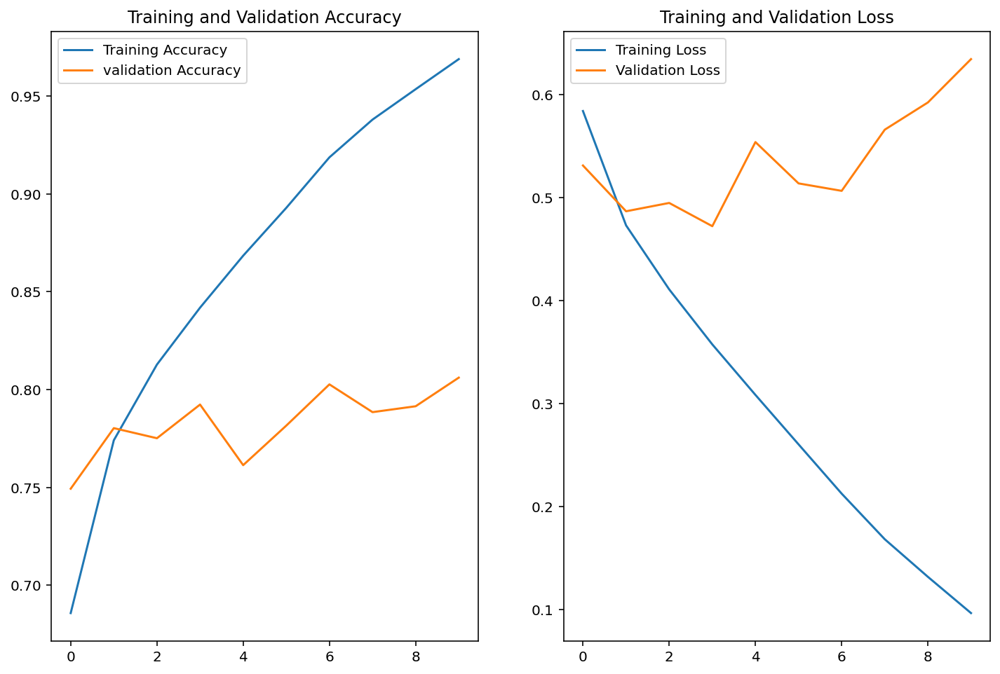

In [21]:
#학습 단계에 따른 정확도 변화를 그래프로 확인
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize = (12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label = 'Training Accuracy')
plt.plot(epochs_range, val_acc, label = 'validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label = 'Training Loss')
plt.plot(epochs_range, val_loss, label = 'Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

두 그래프 모두 훈련 데이터셋에 대한 수치와 검증 데이터셋에 대한 수치를 나타낸다.

Training and Validation Accuracy에서는 Training Accuray 값이 계속해서 증가한다는 것을 알 수 있고, Validation Accuracy값이 5까지는 증가하는 경향을 보이다 5 ~ 8까지는 정확도가 떨어지는 경향을 보인다. 그리고 8 ~ 10까지는 다시 정확도가 증가한다.

Training and Validation Loss에서는 Training Loss 값이 계속해서 감소하는 것을 볼 수 있고, Validation Losss는 8에서 손실값이 확 높아지는 것을 볼 수 있다.

In [22]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9803370e-01, 1.9662890e-03],
       [9.7410446e-01, 2.5895473e-02],
       [1.7746726e-01, 8.2253277e-01],
       [9.9998987e-01, 1.0178081e-05],
       [9.9363375e-01, 6.3662515e-03],
       [2.1253748e-01, 7.8746247e-01],
       [5.9193401e-03, 9.9408060e-01],
       [5.8557642e-01, 4.1442356e-01],
       [1.0179631e-01, 8.9820367e-01],
       [9.3702577e-02, 9.0629739e-01],
       [3.2508448e-01, 6.7491555e-01],
       [9.9984860e-01, 1.5138900e-04],
       [9.8890698e-01, 1.1093071e-02],
       [6.3876760e-05, 9.9993610e-01],
       [9.9511319e-01, 4.8868060e-03],
       [9.9820900e-01, 1.7910389e-03],
       [7.6498657e-01, 2.3501340e-01],
       [9.2973011e-07, 9.9999905e-01],
       [1.8495066e-01, 8.1504929e-01],
       [9.9947649e-01, 5.2358152e-04],
       [7.6008177e-01, 2.3991825e-01],
       [8.7641209e-01, 1.2358796e-01],
       [9.9996328e-01, 3.6723319e-05],
       [9.4121975e-01, 5.8780178e-02],
       [9.9049860e-01, 9.5013846e-03],
       [3.0289197e-04, 9.

이 값은 모델이 판단한 [고양이일 확률, 강아지의 확률]이다.

[1.0, 0.0]에 가까울수록 label이 0인 고양이, [0.0, 1.0]에 가까울수록 label이 1인 강아지로 예측했다고 볼 수 있다.

In [23]:
#prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환해보자
predictions = np.argmax(predictions, axis = 1)
predictions

array([0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0])

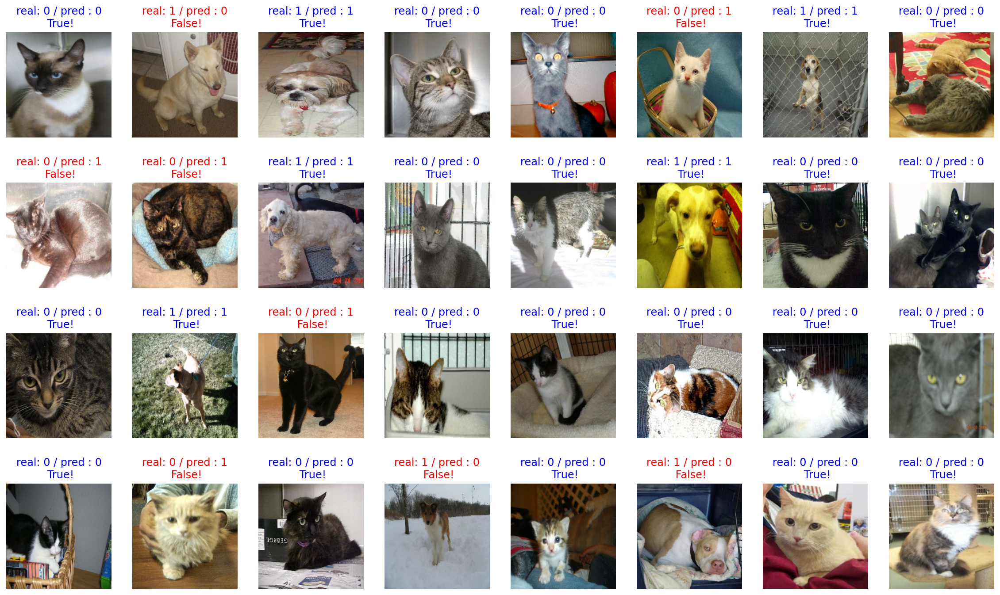

In [24]:
#이렇게 얻은 32장의 이미지, 32개의 라벨, 32개의 prediction을 각각 시각화 해서 확인한다.
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx + 1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred : {prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict = {'color': 'red'})
    else:
        plt.title(title, fontdict = {'color': 'blue'})
    plt.axis('off')

#### 32개 이미지에 대해서는 예측(prediction)의 정확도(accuracy)가 몇일까

In [25]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

75.0


정확도가 68.75%가 나왔다.

그렇다면, 엄청나게 크고, 학습 시간도 오래 걸리는 모델을 이미 학습 시켜 놓은 것을 가져다 써보면 정확도가 몇 퍼센트가 나오게 될까?

밑에서 살펴보도록 하자.

* 코드 입력시 오타에 주의하도록 하자. 한 번 입력할 때 제대로 입력해야 에러가 뜰 확률이 조금이라도 적어진다... 문법에러, 정의가 안 됐다는 에러를 보면 오타를 찾느라 시간이 너무 걸린다. 타자 실력을 얼른 완벽하게 갖추어야할 것 같다.

# 이미 만들어져 있는 강아지 고양이 분류기를 사용하여 정확도를 알아보자

수백만의 데이터를 분류하는 데 2.3%밖에 틀리지 않았던 모델을 이용하여 전이학습 해서 강아지 고양이 분류를 해볼 것이다.

## 전이학습(Transfer Learning)

: 사전학습 된 모델 (pre-trained model) 을 이용하는 것


### 6)사전 학습 모델인 VGG16을 가져오고, 모델의 구조 확인하기

In [26]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# 사전 학습 모델인 VGG16 가져오기
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [27]:
#모델에 이미지 데이터가 들어가면 어떻게 되는지 확인
image_batch.shape

TensorShape([32, 160, 160, 3])

In [28]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

피쳐 배치를 사용하니 이미지의 사이즈와 채널 값이 달라진 것을 확인할 수 있다.

이 벡터는 이미지에서 특징을 추출해 낸 특징벡터라고 부르기도 한다.

In [29]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

VGG16 모델에는 Conv(Convolutional layer), Pooling(MaxPooling layer), Dense(Fully connected layer), softmax layer의 총 네 가지 종류의 레이어만 쓰였다.

VGG16 모델은 총 5개의 Conv-pooling 블록과 1개의 Dense 블록으로 구성되어 있는데, 

첫 번째 블록은 2개의 Conv 레이어와 1개의 Pooling 레이어, 

두 번째 블록은 2개의 Conv 레이어와 1개의 Pooling 레이어, 

세 번째 블록은 3개의 Conv 레이어와 1개의 Pooling 레이어, 

네 번째 블록은 3개의 Conv 레이어와 1개의 Pooling 레이어, 

다섯 번째 블록은 3개의 Conv 레이어와 1개의 Pooling 레이어, 

여섯 번째 블록은 3개의 Dense 레이어로 구성되어 있다.

하지만 우리가 위에서 가져온 모델의 model.summary()를 보면 마지막의 Dense 레이어로 이루어진 블록이 빠진 걸 볼 수 있는데, 이는 Transfer Learning을 수행하며 새로 학습시킬 것이기 때문에 빠진 것이다.

## 7)VGG16 끝단에 classifier 레이어를 붙여서 원하는 구조의 분류 모델 만들기

classifier를 구성하려면 Fully connected 레이어로 구성해야한다. 이전 계층의 모든 숫자들이 다음 계층의 모든 숫자와 연결이 되어야 한다는 것이다. 이런 구조 때문에 Fully connected 레이어에 입력될 수 있는 벡터는 반드시 1차원이어야 한다.

그러나 VGG16이 출력하는 벡터는 (5, 5, 512)로 3차원의 구조를 가졌기 때문에 classifier를 구성하기 전에 이 3차원 벡터를 Global Average Pooling으로 1차원 벡터로 변환하는 작업을 거쳐야 한다.

* Global Average Pooling
 : 3차원의 벡터가 있을 때, 겹겹이 쌓여있는 2차원 배열의 평균을 구한 후 하나의 값으로 축소하는 기법
 : (1, 1, Depth)인 1차원 벡터로 바뀌게 된다.
 
 여기선,  VGG16이 출력한 벡터  [32, 5, 5, 512]이 Global Average Pooling을 취하게 되면 [32, 512]로 볼 수 있는 [32, 1, 1, 512]가 된다.

In [30]:
#Global Average Pooling 계층을 만드는 코드
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [31]:
#global_average_layer에 위에서 VGG16이 출력했던 feature_batch를 입력
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


평균이 잘 취해진 것을 확인할 수 있다.

In [32]:
#Dense 레이어들을 붙여주어 classifier 완성시키기
dense_layer = tf.keras.layers.Dense(512, activation = 'relu')
prediction_layer = tf.keras.layers.Dense(2, activation = 'softmax')

#feature_batch_average가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))
print(prediction_batch.shape)

(32, 2)


activation: 활성화 함수. 입력값을 non-linear한 방식으로 출력값을 얻기 위해 사용.

### VGG16로 강아지 고양이 분류 모델 만들기

VGG16로 만드는 강아지 고양이 분류 모델은 VGG16에 데이터들이 입력되어 특징이 추출되고, 그 특징 벡터가 global_average_layer를 거쳐 마지막에 prediction_layer를 통과하며 강아지인지 고양이인지 예측이 될 것이다.

In [33]:
base_model.trainable = False #base_model은 학습 시키지 않을 것이라 학습 여부를 결정하는 trainable 변수를 False로 지정해서 꺼준다.

#최종모델

model = tf.keras.Sequential([
    base_model,
    global_average_layer,
    dense_layer,
    prediction_layer
])

In [34]:
#모델 구조 확인
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


## 8)VGG16을 기반으로 구성된 이미지 분류기를 학습시키고, 직접 만들었던 모델과 결과 비교해 보기

In [35]:
#모델 compile
base_learning_rate = 0.0001
model.compile(optimizer = tf.keras.optimizers.RMSprop(lr=base_learning_rate),
             loss = tf.keras.losses.sparse_categorical_crossentropy,
             metrics = ['accuracy'])

In [36]:
#모델 학습 전에 초기 손실과 정확도 값을 확인
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print('initial loss: {:.2f}'.format(loss0))
print('initial accuracy: {:.2f}'.format(accuracy0))

 5/20 [======>.......................] - ETA: 1s - loss: 0.8327 - accuracy: 0.4313

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


17/20 [========================>.....] - ETA: 0s - loss: 0.8041 - accuracy: 0.4669

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 6s 76ms/step - loss: 0.7992 - accuracy: 0.4703
initial loss: 0.80
initial accuracy: 0.47


정확도가 52%로 낮은 것을 확인

In [37]:
#모델 학습
EPOCHS= 5

history = model.fit(train_batches,
                   epochs = EPOCHS,
                   validation_data = validation_batches)


Epoch 1/5
167/582 [=======>......................] - ETA: 35s - loss: 0.3855 - accuracy: 0.8640

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 32s - loss: 0.3631 - accuracy: 0.8720

210/582 [=========>....................] - ETA: 32s - loss: 0.3581 - accuracy: 0.8740

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 25s - loss: 0.3247 - accuracy: 0.8851

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.2710 - accuracy: 0.9003

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.2688 - accuracy: 0.9006

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.2668 - accuracy: 0.9012

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.2613 - accuracy: 0.9030

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2607 - accuracy: 0.9031

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2558 - accuracy: 0.9049

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 61s 103ms/step - loss: 0.2558 - accuracy: 0.9049 - val_loss: 0.1725 - val_accuracy: 0.9334
Epoch 2/5
168/582 [=======>......................] - ETA: 35s - loss: 0.1653 - accuracy: 0.9356

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 32s - loss: 0.1642 - accuracy: 0.9362

210/582 [=========>....................] - ETA: 31s - loss: 0.1642 - accuracy: 0.9360

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 25s - loss: 0.1667 - accuracy: 0.9325

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1619 - accuracy: 0.9345

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1619 - accuracy: 0.9341

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1616 - accuracy: 0.9343

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1609 - accuracy: 0.9346

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 3s - loss: 0.1606 - accuracy: 0.9347

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1595 - accuracy: 0.9352

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 56s 95ms/step - loss: 0.1595 - accuracy: 0.9352 - val_loss: 0.1565 - val_accuracy: 0.9385
Epoch 3/5
167/582 [=======>......................] - ETA: 35s - loss: 0.1437 - accuracy: 0.9407

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 32s - loss: 0.1424 - accuracy: 0.9405

210/582 [=========>....................] - ETA: 31s - loss: 0.1434 - accuracy: 0.9403

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 25s - loss: 0.1454 - accuracy: 0.9388

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1464 - accuracy: 0.9401

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1465 - accuracy: 0.9396

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1466 - accuracy: 0.9395

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1462 - accuracy: 0.9399

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1461 - accuracy: 0.9401

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1448 - accuracy: 0.9406

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 56s 94ms/step - loss: 0.1448 - accuracy: 0.9406 - val_loss: 0.1495 - val_accuracy: 0.9351
Epoch 4/5
167/582 [=======>......................] - ETA: 35s - loss: 0.1363 - accuracy: 0.9435

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 32s - loss: 0.1343 - accuracy: 0.9447

210/582 [=========>....................] - ETA: 31s - loss: 0.1344 - accuracy: 0.9442

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 25s - loss: 0.1394 - accuracy: 0.9414

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1407 - accuracy: 0.9416

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1403 - accuracy: 0.9415

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1399 - accuracy: 0.9418

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1391 - accuracy: 0.9426

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1392 - accuracy: 0.9428

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1384 - accuracy: 0.9429

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 56s 94ms/step - loss: 0.1384 - accuracy: 0.9429 - val_loss: 0.1422 - val_accuracy: 0.9424
Epoch 5/5
167/582 [=======>......................] - ETA: 35s - loss: 0.1324 - accuracy: 0.9463

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 32s - loss: 0.1337 - accuracy: 0.9445

210/582 [=========>....................] - ETA: 31s - loss: 0.1328 - accuracy: 0.9445

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 25s - loss: 0.1334 - accuracy: 0.9436

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1356 - accuracy: 0.9439

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1349 - accuracy: 0.9445

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1350 - accuracy: 0.9443

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1336 - accuracy: 0.9448

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1338 - accuracy: 0.9449

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1334 - accuracy: 0.9450

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 55s 94ms/step - loss: 0.1334 - accuracy: 0.9450 - val_loss: 0.1438 - val_accuracy: 0.9428


최종 정확도가 94.28%로 높은 값을 보여주고 있다.

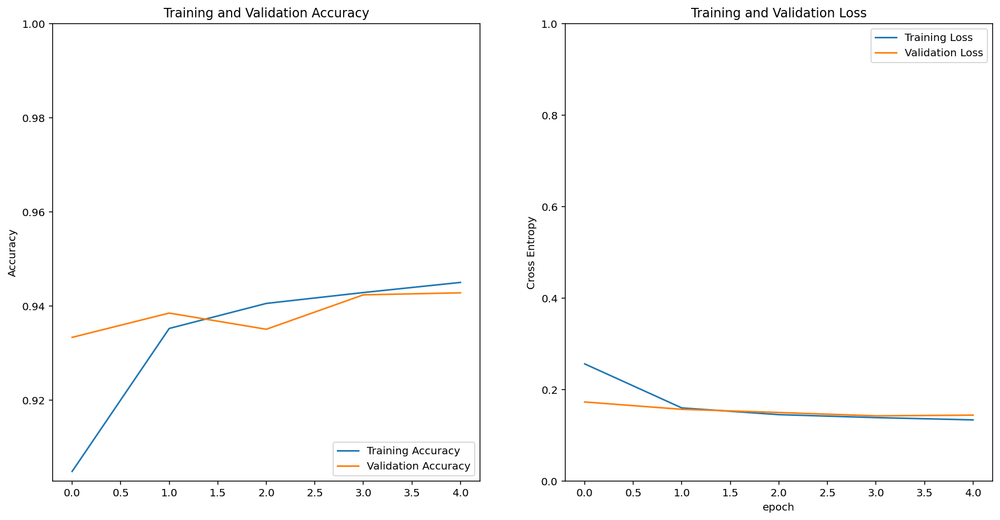

In [38]:
#그래프로 학습 과정 살펴보기
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize = (16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label = 'Training Accuracy')
plt.plot(val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()), 1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label = 'Training Loss')
plt.plot(val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

시작부터 75% 를 넘는 정확도에서 꾸준히 정확도 값이 올라가고 Validation loss도 안정적으로 학습되는 것을 볼 수 있다.

In [39]:
#32개의 test sample에 대한 예측 결과
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99983072e-01, 1.69188334e-05],
       [9.96820778e-02, 9.00317967e-01],
       [2.20883369e-01, 7.79116631e-01],
       [9.99992967e-01, 7.07734716e-06],
       [9.96342361e-01, 3.65761458e-03],
       [9.74710584e-01, 2.52893735e-02],
       [1.06888685e-04, 9.99893069e-01],
       [5.51972210e-01, 4.48027790e-01],
       [9.43367720e-01, 5.66323102e-02],
       [9.44760621e-01, 5.52393459e-02],
       [4.28266285e-05, 9.99957204e-01],
       [9.99896526e-01, 1.03507984e-04],
       [9.80355620e-01, 1.96443200e-02],
       [2.47720618e-06, 9.99997497e-01],
       [9.98068273e-01, 1.93173310e-03],
       [9.79412436e-01, 2.05874871e-02],
       [9.94827330e-01, 5.17265545e-03],
       [1.76386628e-02, 9.82361317e-01],
       [5.60178399e-01, 4.39821541e-01],
       [9.92480040e-01, 7.51998136e-03],
       [9.13237929e-01, 8.67621079e-02],
       [9.68787074e-01, 3.12129688e-02],
       [9.91244078e-01, 8.75591859e-03],
       [9.64079738e-01, 3.59202363e-02],
       [9.974326

In [40]:
#prediction 값들을 실제 추론한 라벨(고양이:0, 강아지:1)로 변환
import numpy as np
predictions = np.argmax(predictions, axis = 1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

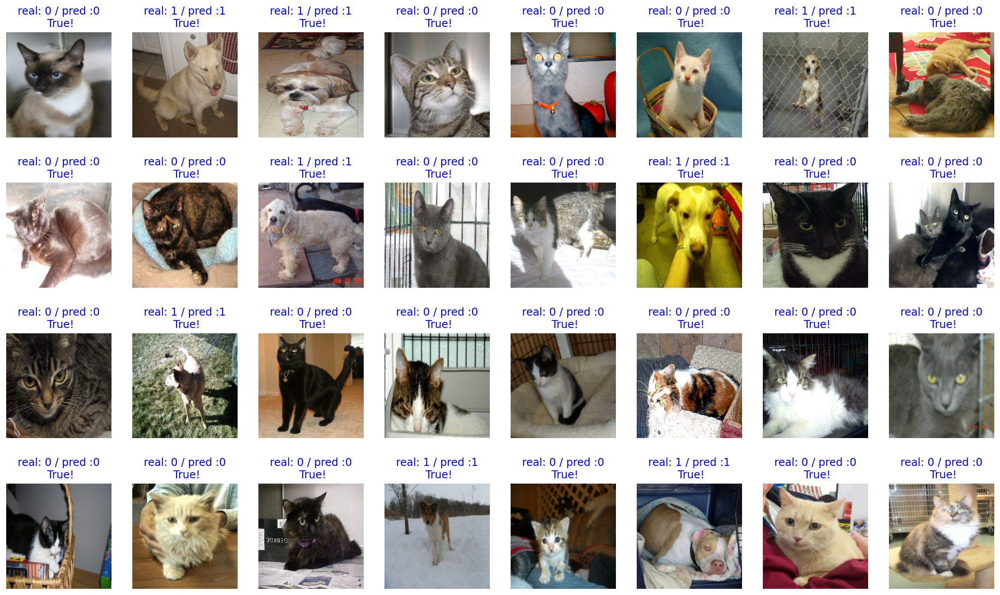

In [41]:
#모델로 강아지 고양이 분류한 결과 확인하기
plt.figure(figsize = (20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx + 1)
    image = (image + 1)/2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict = {'color': 'red'})
    else:
        plt.title(title, fontdict = {'color': 'blue'})
    plt.axis('off')

다 잘 맞춘 것을 확인할 수 있다.

In [42]:
#32개에 대한 정확도
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1
        
print(count / 32 * 100)

100.0


정확도가 100인 결과가 나오게 되었다.
강아지 고양이 분류하는 모델을 직접 만들어도 보고, 원래 있는 모델에서 classifier만 바꿔 실행시켰을 때, 직접 만든 모델 보다 원래 있던 모델이 역시나 정확도가 더 높다는 것을 확인할 수 있었다.

## 9)학습 시킨 모델 저장하기

In [43]:
import os

catvsdog_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/catvsdog"
catvsdog_file_path = os.path.join(catvsdog_dir, 'catvsdog')

if not os.path.exists('catvsdog_dir'):
    os.mkdir('catvsdog_dir')
    
model.save_weights(catvsdog_file_path)

if os.path.exists(catvsdog_file_path):
    print('catvsdog 파일 생성 OK!!')

## 10)내가 저장한 사진을 분류해보기

In [44]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

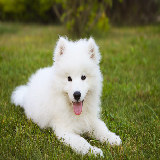

In [45]:
#tensorflow 모델에 입력해주기 위해 load_img, img_to_array 함수를 가져오기
from tensorflow.keras.preprocessing.image import load_img, img_to_array

#이미지 가져오기
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image


In [46]:
#모델에 넣을 수 있도록 이미지를 array, 배열 자료형으로 변환
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [47]:
#이미지를 모델에 넣어 예측
prediction = model.predict(dog_image)
prediction

array([[0., 1.]], dtype=float32)

강아지일 확률이 1로 알맞게 분류된 것을 확인

This image seems 100% dog, and 0% cat.


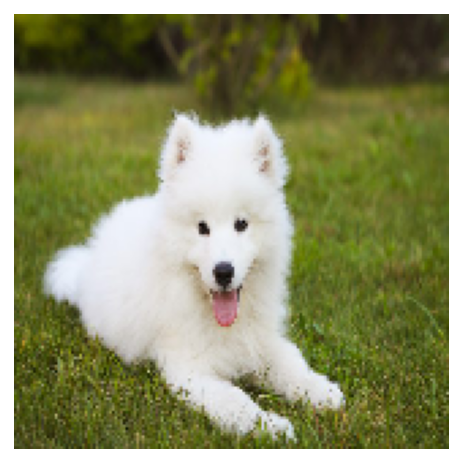

In [48]:
#원하는 이미지를 예측할 수 있는 함수 만들기
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")
    
#함수 이용해보기
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


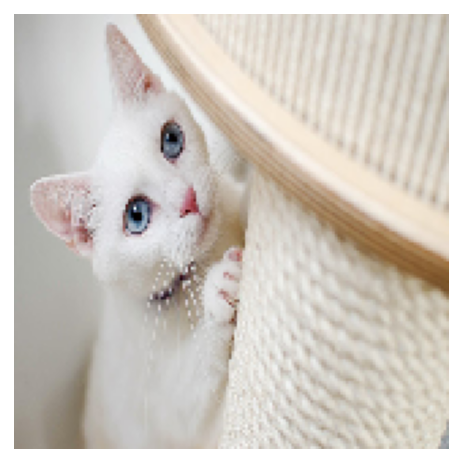

In [49]:
#고양이 예측
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

100%는 아니지만 98%의 확률로 고양이이라고 예측했다.

This image seems 100% dog, and 0% cat.


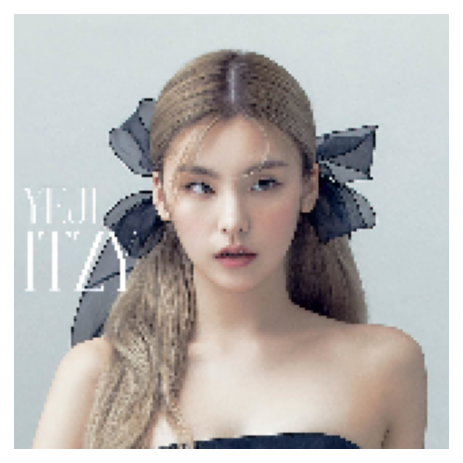

In [50]:
#고양이상 연예인 잇지 예지 사진으로 진행
filename = "cat_face.png"
show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


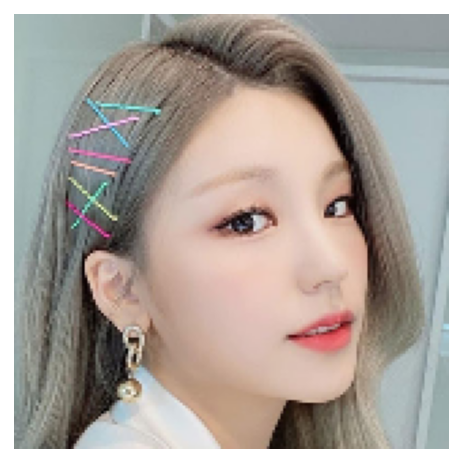

In [51]:
#다른 예지 사진으로 진행
filename = "cat_face2.png"
show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


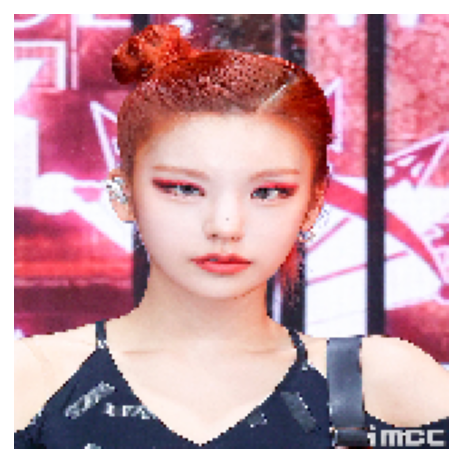

In [52]:
#또다른 예지 사진으로 진행
filename = "cat_face3.jpg"
show_and_predict_image(img_dir_path, filename)

같은 사람이라도 화장법, 표정에 따라서 강아지상인지 고양이상인지가 다르게 정해지는 것을 알 수 있다.